In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px
import plotly.graph_objects as go

import warnings
warnings.filterwarnings('ignore')

In [12]:
df=pd.read_csv('house data.csv')

**Data Exploration**

In [13]:
df.head()

,status,bed,bath,acre_lot,city,state,zip_code,house_size,prev_sold_date,price
0,for_sale,3.0,2.0,0.12,Adjuntas,Puerto Rico,601.0,920.0,NaN,105000.0
1,for_sale,4.0,2.0,0.08,Adjuntas,Puerto Rico,601.0,1527.0,NaN,80000.0
2,for_sale,2.0,1.0,0.15,Juana Diaz,Puerto Rico,795.0,748.0,NaN,67000.0
3,for_sale,4.0,2.0,0.10,Ponce,Puerto Rico,731.0,1800.0,NaN,145000.0
4,for_sale,6.0,2.0,0.05,Mayaguez,Puerto Rico,680.0,NaN,NaN,65000.0


In [14]:
df.shape

(1401066, 10)

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1401066 entries, 0 to 1401065
Data columns (total 10 columns):
 #   Column          Non-Null Count    Dtype  
---  ------          --------------    -----  
 0   status          1401066 non-null  object 
 1   bed             1184538 non-null  float64
 2   bath            1206853 non-null  float64
 3   acre_lot        1043599 non-null  float64
 4   city            1400875 non-null  object 
 5   state           1401066 non-null  object 
 6   zip_code        1400587 non-null  float64
 7   house_size      950954 non-null   float64
 8   prev_sold_date  714773 non-null   object 
 9   price           1400958 non-null  float64
dtypes: float64(6), object(4)
memory usage: 106.9+ MB


In [16]:
df.describe()

,bed,bath,acre_lot,zip_code,house_size,price
count,1.184538e+06,1.206853e+06,1.043599e+06,1.400587e+06,9.509540e+05,1.400958e+06
mean,3.392347e+00,2.487426e+00,3.215013e+01,8.356641e+03,2.178643e+03,8.186029e+05
std,2.051858e+00,1.873599e+00,1.249983e+03,4.130465e+03,3.492618e+03,2.683069e+06
min,1.000000e+00,1.000000e+00,0.000000e+00,6.010000e+02,4.000000e+00,0.000000e+00
25%,2.000000e+00,2.000000e+00,1.200000e-01,5.652000e+03,1.170000e+03,2.350000e+05
50%,3.000000e+00,2.000000e+00,3.200000e-01,8.757000e+03,1.700000e+03,4.467770e+05
75%,4.000000e+00,3.000000e+00,1.340000e+00,1.142600e+04,2.500000e+03,7.950000e+05
max,1.230000e+02,1.980000e+02,1.000000e+05,9.999900e+04,1.450112e+06,8.750000e+08


In [17]:
df.describe(include = 'object')

,status,city,state,prev_sold_date
count,1401066,1400875,1401066,714773
unique,2,3512,19,10319
top,for_sale,New York City,New York,2022-04-15
freq,1399134,61299,653061,734


**Data Cleaning**

In [18]:
df.duplicated().sum()

1249026

In [19]:
df.drop_duplicates(inplace=True)

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 152040 entries, 0 to 1401063
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   status          152040 non-null  object 
 1   bed             126791 non-null  float64
 2   bath            128499 non-null  float64
 3   acre_lot        115074 non-null  float64
 4   city            152004 non-null  object 
 5   state           152040 non-null  object 
 6   zip_code        151993 non-null  float64
 7   house_size      102571 non-null  float64
 8   prev_sold_date  79419 non-null   object 
 9   price           152020 non-null  float64
dtypes: float64(6), object(4)
memory usage: 12.8+ MB


In [21]:
df_missing=df.isna().sum()*100/len(df)
print('Missing Values in Percentages')
df_missing

Missing Values in Percentages


status             0.000000
bed               16.606814
bath              15.483425
acre_lot          24.313339
city               0.023678
state              0.000000
zip_code           0.030913
house_size        32.536832
prev_sold_date    47.764404
price              0.013154
dtype: float64

In [22]:
df.isnull().sum()

status                0
bed               25249
bath              23541
acre_lot          36966
city                 36
state                 0
zip_code             47
house_size        49469
prev_sold_date    72621
price                20
dtype: int64

Here We can see that there are lots of missing values in Bed, Bath, Acre_lot, House_size and Previous_sold_date so we will use imputer for all except prev_sold_date because it will not contribute much in our analysis

In [23]:
# Mode imputation to handle missing value
df['bed'].fillna(df['bed'].mode()[0], inplace=True)
df['bath'].fillna(df['bath'].mode()[0], inplace=True)
df['acre_lot'].fillna(df['acre_lot'].mode()[0], inplace=True)
df['house_size'].fillna(df['house_size'].mode()[0], inplace=True)

In [24]:
df = df.dropna(subset=['zip_code','city', 'price'])
df = df.drop('prev_sold_date', axis=1)

In [25]:
df.isnull().sum()

status        0
bed           0
bath          0
acre_lot      0
city          0
state         0
zip_code      0
house_size    0
price         0
dtype: int64

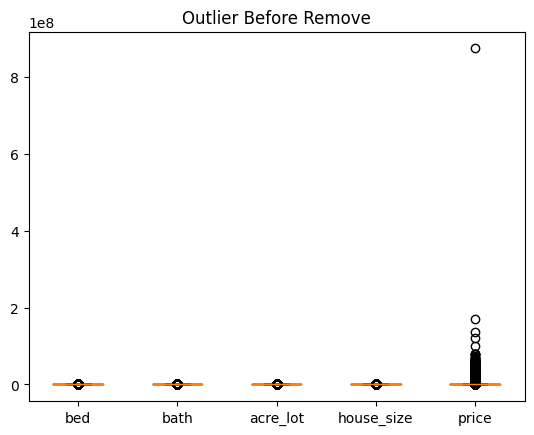

Total Row With Outlier: 151956


In [26]:
column_num = ['bed','bath','acre_lot','house_size','price']
plt.boxplot(df[column_num])
plt.xticks([1, 2, 3, 4, 5], column_num)
plt.title('Outlier Before Remove')
plt.show()
print(f'Total Row With Outlier: {df.shape[0]}')

In [27]:
column_num = ['bed', 'bath', 'acre_lot', 'house_size']
Q1 = df[column_num].quantile(0.25)
Q3 = df[column_num].quantile(0.75)
IQR = Q3 - Q1

df = df[~((df[column_num] < (Q1 - 1.5 * IQR)) | (df[column_num] > (Q3 + 1.5 * IQR))).any(axis=1)]

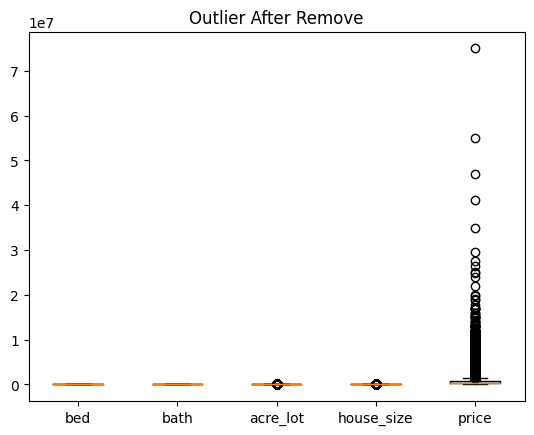

Total Row Without Outlier: 99174


In [28]:
column_num = ['bed','bath','acre_lot','house_size','price']
plt.boxplot(df[column_num])
plt.xticks([1, 2, 3, 4, 5], column_num)
plt.title('Outlier After Remove')
plt.show()
print(f'Total Row Without Outlier: {df.shape[0]}')

In [29]:
df.describe()

,bed,bath,acre_lot,zip_code,house_size,price
count,99174.000000,99174.000000,99174.000000,99174.000000,99174.000000,9.917400e+04
mean,3.089429,2.163329,0.271746,9563.765795,1521.393047,6.289245e+05
std,0.815400,0.809060,0.312260,4520.140038,560.593665,9.821147e+05
min,2.000000,1.000000,0.000000,601.000000,4.000000,0.000000e+00
25%,3.000000,2.000000,0.110000,7003.000000,1200.000000,2.250000e+05
50%,3.000000,2.000000,0.120000,10003.000000,1238.000000,3.999000e+05
75%,4.000000,3.000000,0.310000,11798.000000,1817.000000,6.799000e+05
max,5.000000,4.000000,1.580000,95652.000000,3300.000000,7.500000e+07


**Explotatory Data Analysis**

<function matplotlib.pyplot.show(close=None, block=None)>

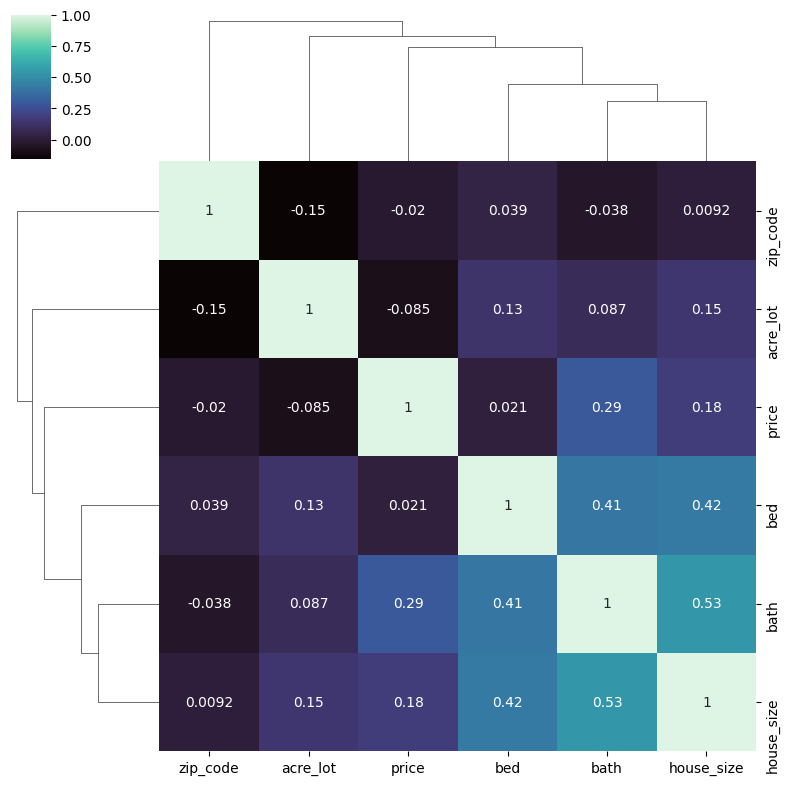

In [30]:
sns.clustermap(
    df.corr(),
    annot=True,
    cmap='mako',
    figsize=(8, 8)
)
plt.show

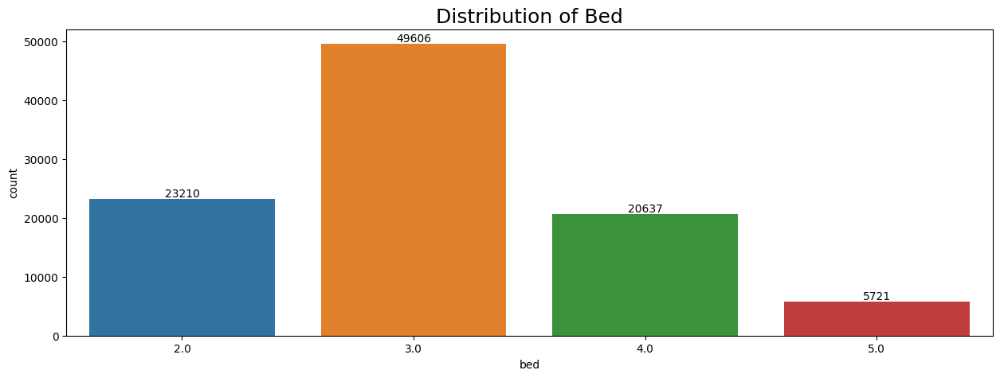

In [31]:
plt.figure(figsize=(15,5))
ax=sns.countplot(data=df,x='bed')
plt.title('Distribution of Bed', fontsize=18)
for i in ax.containers:
    ax.bar_label(i,)

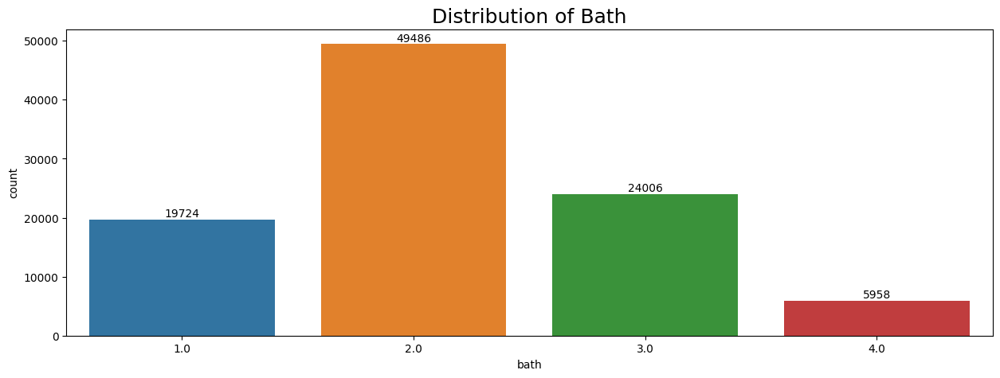

In [32]:
plt.figure(figsize=(15,5))
ax=sns.countplot(data=df,x='bath')
for i in ax.containers:
    ax.bar_label(i,)
plt.title('Distribution of Bath', fontsize=18)
plt.show()

In [33]:
df.groupby('bed', as_index=False).agg({'bath' : 'mean'}).sort_values('bath', ascending=False)

,bed,bath
3,5.0,2.874148
2,4.0,2.619567
1,3.0,2.075092
0,2.0,1.771047


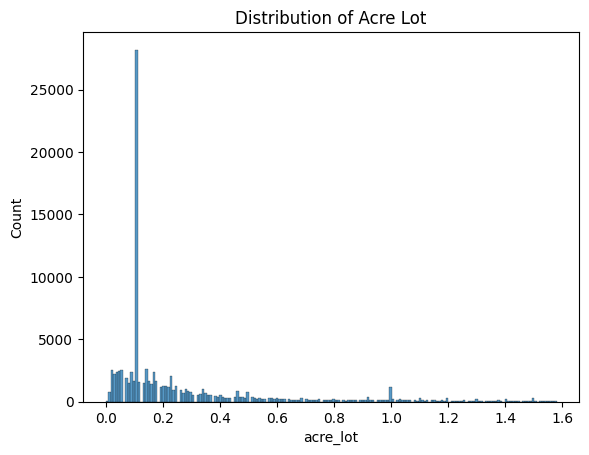

In [34]:
sns.histplot(data=df, x="acre_lot")
plt.title('Distribution of Acre Lot')
plt.show()

In [35]:
df['acre_lot'].value_counts()

0.11    28202
0.14     2609
0.02     2541
0.06     2529
0.05     2468
        ...  
1.58       39
1.54       38
1.55       37
1.57       35
1.43       35
Name: acre_lot, Length: 159, dtype: int64

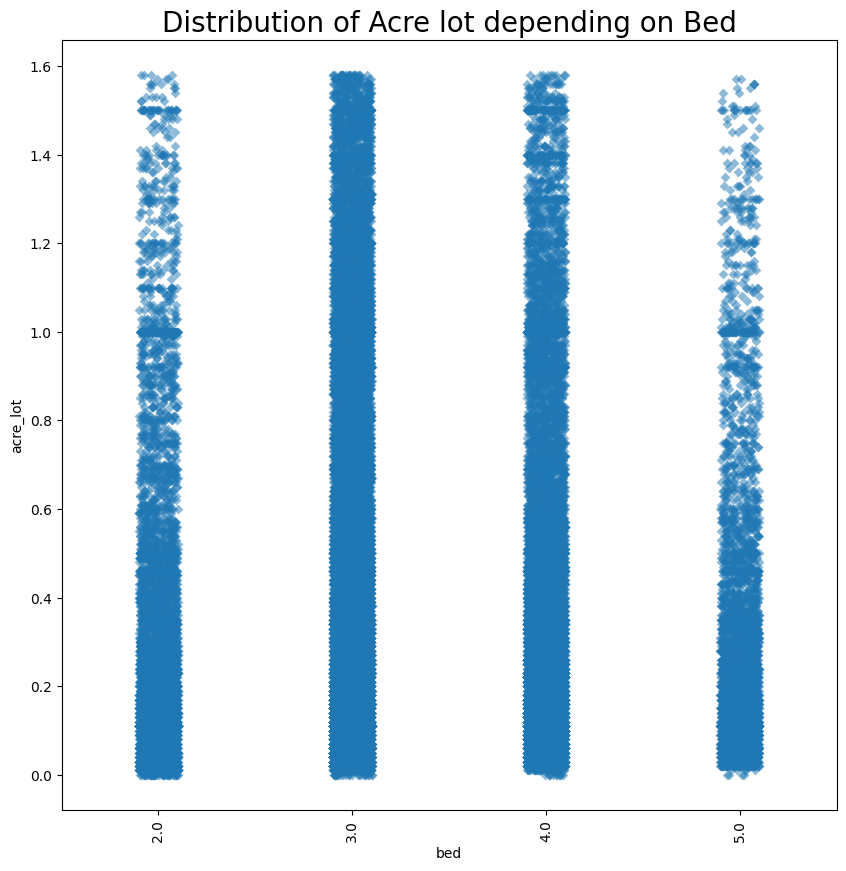

In [36]:
plt.subplots(figsize=(10,10))
plt.xticks(rotation=90)
sns.stripplot(y='acre_lot',x='bed',data=df,marker='D',alpha=0.5)
plt.title('Distribution of Acre lot depending on Bed', fontsize=20)
plt.show()

In [37]:
df.groupby('bed',as_index=False).agg({'acre_lot':'count'}).sort_values('bed',ascending=False)

,bed,acre_lot
3,5.0,5721
2,4.0,20637
1,3.0,49606
0,2.0,23210


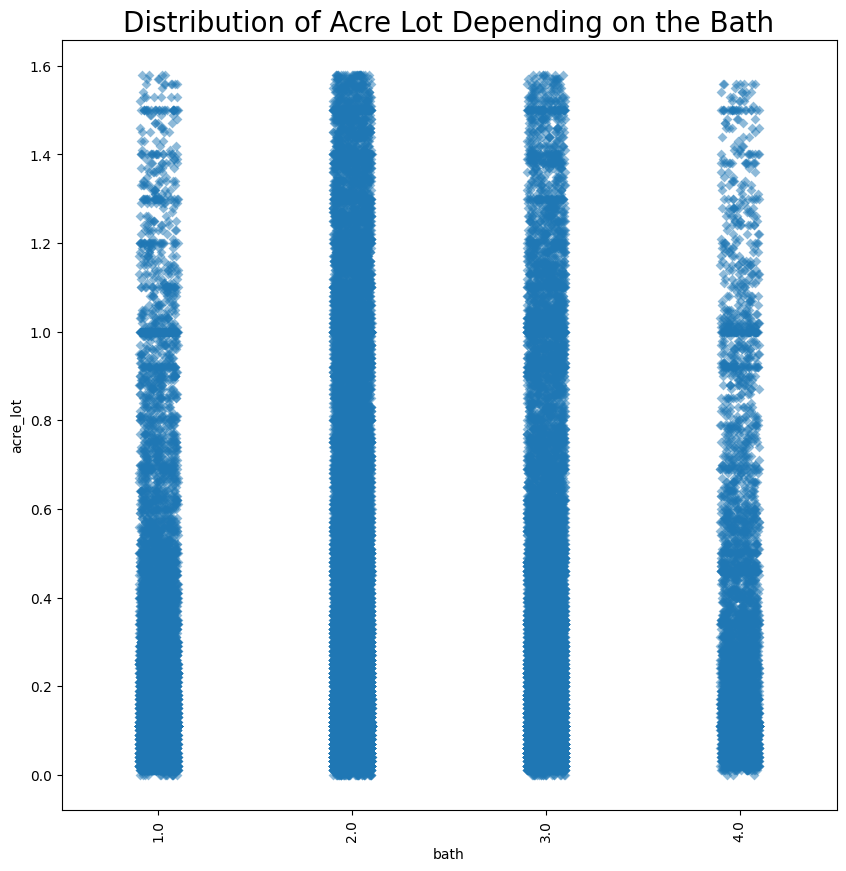

In [38]:
plt.subplots(figsize=(10,10))
plt.xticks(rotation=90)
sns.stripplot(y='acre_lot', x='bath', data=df, marker='D', alpha=0.5)
plt.title('Distribution of Acre Lot Depending on the Bath',fontsize = 20)
plt.show()

In [39]:
df.groupby('bath', as_index=False).agg({'acre_lot' : 'count'}).sort_values('bath', ascending=False)

,bath,acre_lot
3,4.0,5958
2,3.0,24006
1,2.0,49486
0,1.0,19724


**Top Five Cities**

In [40]:
City = df['city'].value_counts().reset_index().rename(columns={'index': 'city', 'city': 'count'})
top_5 = City[:5]
fig = px.bar(top_5,'city', y='count', color='city', template='plotly')
fig.update_layout(title='Distribution of Top 5 Cities with Most Houses')
fig.update_traces(texttemplate='%{y:.}', textposition='outside')
fig.show()

In [41]:
top10 = df.groupby('city')['bed'].sum().nlargest(10).reset_index()

fig = px.bar(top10, x='city', y='bed',color='bed', template='plotly',
             title='Top 10 Cities with the Most Total Beds')
fig.update_traces(texttemplate='%{y:.}', textposition='outside')
fig.show()

In [42]:
top10 = df.groupby('city')['bath'].sum().nlargest(10).reset_index()

fig = px.bar(top10, x='city', y='bath',color='bath', template='plotly',
             title='Top 10 Cities with the Most Total Bath')
fig.update_traces(texttemplate='%{y:.}', textposition='outside')
fig.show()

In [43]:
df_mean = df.groupby('city')[['bed', 'bath']].mean().reset_index()

df_mean_sort = df_mean.sort_values(by=['bed', 'bath'], ascending=False)

top10 = df_mean_sort.head(10)

fig = px.bar(top10, x='city', y=['bed', 'bath'], barmode='group',
             color_discrete_sequence=['blue', 'orange'],
             labels={'value': 'Mean Bed and Bath'},
             title='Top 10 Cities with Highest Mean Bed and Bath')

fig.update_traces(texttemplate='%{y:.}', textposition='outside')
fig.show()

In [44]:
top10 = df.groupby('city')['acre_lot'].sum().nlargest(10).reset_index()

fig = px.bar(top10, x='city', y='acre_lot',color='city', template='plotly',
             title='Top 10 Cities with Highest Most Acre Lot')
fig.update_traces(texttemplate='%{y:.2f}', textposition='outside')
fig.show()

In [45]:
df_mean = df.groupby('city')['acre_lot'].mean().reset_index()

df_mean_sort = df_mean.sort_values(by='acre_lot', ascending=False)

top10 = df_mean_sort.head(10)

fig = px.bar(top10, x='city', y='acre_lot', color='acre_lot', template='plotly',
             title='Top 10 Cities with Highest Mean Acre Lot')
fig.update_layout(xaxis_title='City', yaxis_title='Mean Acre Lot')
fig.update_traces(texttemplate='%{y:.2f}', textposition='outside')
fig.show()

In [46]:
fig = px.histogram(df, x='state', nbins=25, color='state', template='plotly')
fig.update_layout(title='Distribution of State')
fig.update_traces(texttemplate='%{y:.2f}', textposition='outside')
fig.show()

In [47]:
city_bed_count = df.groupby(['state', 'bed']).size().reset_index(name='count')

fig = px.bar(city_bed_count, x='state', y='count', color='bed', barmode='stack',
             title='Distribution of State with Bed')
fig.show()

In [48]:
df.groupby('state', as_index=False).agg({'bed' : 'mean'}).sort_values('bed', ascending=False)

,state,bed
2,Georgia,4.333333
16,West Virginia,4.000000
6,New Jersey,3.181448
1,Delaware,3.150722
9,Puerto Rico,3.136564
8,Pennsylvania,3.090315
0,Connecticut,3.079896
7,New York,3.073023
3,Maine,3.024466
13,Vermont,3.024201


In [49]:
city_bed_count = df.groupby(['state', 'bath']).size().reset_index(name='count')

fig = px.bar(city_bed_count, x='state', y='count', color='bath', barmode='stack',
             title='Distribution of State with Bath')
fig.show()

In [50]:
df.groupby('state', as_index=False).agg({'bath' : 'mean'}).sort_values('bath', ascending=False)

,state,bath
17,Wyoming,3.000000
2,Georgia,2.666667
6,New Jersey,2.283727
1,Delaware,2.253610
0,Connecticut,2.240365
4,Massachusetts,2.154793
7,New York,2.119628
13,Vermont,2.116167
14,Virgin Islands,2.110169
5,New Hampshire,2.092014


In [51]:
df.groupby('state', as_index=False).agg({'acre_lot' : 'mean'}).sort_values('acre_lot', ascending=False)

,state,acre_lot
12,Tennessee,0.920000
3,Maine,0.664919
14,Virgin Islands,0.624068
13,Vermont,0.519284
5,New Hampshire,0.494994
0,Connecticut,0.394522
2,Georgia,0.376667
4,Massachusetts,0.339186
17,Wyoming,0.290000
10,Rhode Island,0.280192


In [52]:
fig = px.histogram(df, x='house_size', nbins=20)
fig.update_layout(title='Distribution of House Size')
fig.show()

In [53]:
df['house_size'].value_counts()

1200.0    29776
1000.0      543
1500.0      531
1100.0      528
2000.0      513
          ...  
577.0         1
371.0         1
181.0         1
2966.0        1
3181.0        1
Name: house_size, Length: 2947, dtype: int64

In [54]:
fig = px.histogram(df, x='house_size', color='bed', nbins=25, marginal='box',
                   labels={'house_size':'House Size (sqft)'},
                   title='Distribution of House Size with Bed')

fig.show()

In [55]:
df.groupby('bed', as_index=False).agg({'house_size' : 'mean'}).sort_values('house_size', ascending=False)

,bed,house_size
3,5.0,1950.918895
2,4.0,1876.487086
1,3.0,1462.867314
0,2.0,1224.875786


In [56]:

fig = px.histogram(df, x="house_size", color="bath", nbins=25, marginal="box")
fig.update_layout(title="Distribution of House Size with Bath", xaxis_title="House Size", yaxis_title="Count")
fig.show()

In [57]:
df.groupby('bath', as_index=False).agg({'house_size' : 'mean'}).sort_values('house_size', ascending=False)

,bath,house_size
3,4.0,2101.585264
2,3.0,1889.806548
1,2.0,1438.167300
0,1.0,1106.547658


In [58]:
fig = px.scatter(df, x='bed', y='bath', size='house_size', color='bed', opacity=1,
                 marginal_x='histogram', marginal_y='histogram',
                 labels={'bed': 'Bedrooms', 'bath': 'Bathrooms', 'house_size': 'House Size'},
                 title='Distribution of House Size by Bedrooms and Bathrooms')
fig.show()

In [59]:
df_mean = df.groupby('acre_lot')['house_size'].mean().reset_index()

fig = px.scatter(df_mean, x='acre_lot', y='house_size', title='Average House Size by Acre Lot',trendline='ols')
fig.show()

In [60]:
df_mean = df.groupby('city')['house_size'].mean().reset_index()
df_mean_sort = df_mean.sort_values(by='house_size', ascending=False)

top10 = df_mean_sort.head(10)

fig = px.bar(top10, x='city', y='house_size', color='house_size',
             color_continuous_scale='RdYlBu_r')
fig.update_layout(title='Top 10 Cities with Highest Mean House Size',
                  xaxis_title='City', yaxis_title='Mean House Size')
fig.update_traces(texttemplate='%{y:.2f}', textposition='outside')
fig.show()

In [61]:
df.groupby('city', as_index=False).agg({'house_size' : 'mean'}).sort_values('house_size', ascending=False)

,city,house_size
378,Cambridge Village,3289.0
2150,Pompey,3222.0
553,Cold Spring Hrbr,3200.0
2130,Pleasant Mount,3192.0
708,Doylestown,3145.0
...,...,...
2056,Passadumkeag,576.0
2859,Waymart,471.0
2420,Scott Township,432.0
2023,Oswegatchie,416.0


In [62]:
df_mean = df.groupby('state')['house_size'].mean().reset_index()

df_mean_sort = df_mean.sort_values(by='house_size', ascending=False)

fig = px.bar(df_mean_sort, x='state', y='house_size', color='state')
fig.update_layout(title='Top 10 States with Highest Average House Size',
                  xaxis_title='State',
                  yaxis_title='Average House Size (sqft)')
fig.update_traces(texttemplate='%{y:.1f}', textposition='outside')
fig.show()

In [63]:
df.groupby('state', as_index=False).agg({'house_size' : 'mean'}).sort_values('house_size', ascending=False)

,state,house_size
2,Georgia,2477.333333
17,Wyoming,1935.000000
16,West Virginia,1860.000000
1,Delaware,1791.245487
0,Connecticut,1639.193036
4,Massachusetts,1637.274981
5,New Hampshire,1628.822917
13,Vermont,1598.906099
10,Rhode Island,1562.679213
8,Pennsylvania,1539.832821


In [64]:
df['price'].value_counts()

599000.0    779
499000.0    771
399000.0    721
325000.0    706
425000.0    680
           ... 
191888.0      1
349895.0      1
349920.0      1
524800.0      1
13750.0       1
Name: price, Length: 6813, dtype: int64

In [65]:
df['price'].value_counts()

599000.0    779
499000.0    771
399000.0    721
325000.0    706
425000.0    680
           ... 
191888.0      1
349895.0      1
349920.0      1
524800.0      1
13750.0       1
Name: price, Length: 6813, dtype: int64

In [66]:
df.groupby('bed', as_index=False).agg({'price' : 'mean'}).sort_values('price', ascending=False)

,bed,price
3,5.0,768615.041951
2,4.0,678667.399816
0,2.0,671870.201896
1,3.0,572026.564589


In [67]:
df.groupby('bath', as_index=False).agg({'price' : 'mean'}).sort_values('price', ascending=False)

,bath,price
3,4.0,1.581606e+06
2,3.0,8.754200e+05
1,2.0,5.139994e+05
0,1.0,3.294793e+05


In [68]:
df_mean = df.groupby('acre_lot')['price'].mean().reset_index()

# plot mean price per acre lot
fig = px.scatter(df_mean, x='acre_lot', y='price', trendline='ols')
fig.update_layout(title='Average Price per Acre Lot', xaxis_title='Acre Lot', yaxis_title='Price')
fig.show()

In [69]:
df_mean = df.groupby('city')['price'].mean().reset_index()

df_mean_sort = df_mean.sort_values(by='price', ascending=False)

top10 = df_mean_sort.head(10)

fig = px.bar(top10, x='city', y='price', color='city',
             labels={'city': 'City', 'price': 'Mean Price'},
             title='Top 10 Cities with the Highest Average Price')
fig.update_traces(texttemplate='%{y:.1f}', textposition='outside')
fig.show()

In [70]:
df.groupby('city', as_index=False).agg({'price' : 'mean'}).sort_values('price', ascending=False)

,city,price
2353,Sagaponack,1.115378e+07
2850,Watermill,4.449000e+06
1500,Loch Arbour Village,4.174500e+06
2800,Wainscott,3.553571e+06
496,Chilmark,3.452500e+06
...,...,...
1417,Lanesboro,1.000000e+04
329,Brookton,9.900000e+03
819,Eleanor Ct,2.990000e+03
1464,Lexington Dr,2.990000e+03


In [71]:
df_mean = df.groupby('state')['price'].mean().reset_index()

df_mean_sort = df_mean.sort_values(by='price', ascending=False)

fig = px.bar(df_mean_sort, x='state', y='price',
             title='Top 10 States with Highest Mean Price',
             labels={'state': 'State', 'price': 'Mean Price'})
fig.update_traces(texttemplate='%{y:.1f}', textposition='outside')
fig.show()

In [72]:
df.groupby('state', as_index=False).agg({'price' : 'mean'}).sort_values('price', ascending=False)

,state,price
7,New York,869487.625508
4,Massachusetts,724682.233515
15,Virginia,555571.428571
17,Wyoming,535000.000000
6,New Jersey,493237.521562
10,Rhode Island,451691.998289
0,Connecticut,404514.286680
5,New Hampshire,377406.378472
2,Georgia,372310.000000
8,Pennsylvania,339437.792083


In [73]:
df_mean = df.groupby('price')['house_size'].mean().reset_index()

fig = px.scatter(df_mean, x='price', y='house_size', trendline='ols',
                 labels={'price':'Price', 'house_size':'Mean House Size'})
fig.update_layout(title='Distribution of Mean House Size by Price')
fig.show()

In [74]:
fig = px.scatter(df, x='house_size', y='price', color='bed', size='bath',trendline='ols')
fig.update_layout(title='House Size vs Price',
                  xaxis_title='House Size',
                  yaxis_title='Price')
fig.show()

**Model Prediction**

In [75]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import RidgeCV, ElasticNetCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

In [76]:
df['house_size'] = StandardScaler().fit_transform(df['house_size'].values.reshape(len(df), 1))
df['price'] = StandardScaler().fit_transform(df['price'].values.reshape(len(df), 1))

In [77]:
df['bed'] = MinMaxScaler().fit_transform(df['bed'].values.reshape(len(df), 1))
df['bath'] = MinMaxScaler().fit_transform(df['bath'].values.reshape(len(df), 1))
df['acre_lot'] = MinMaxScaler().fit_transform(df['acre_lot'].values.reshape(len(df), 1))

In [78]:
df.head()

,status,bed,bath,acre_lot,city,state,zip_code,house_size,price
0,for_sale,0.333333,0.333333,0.075949,Adjuntas,Puerto Rico,601.0,-1.072784,-0.533468
1,for_sale,0.666667,0.333333,0.050633,Adjuntas,Puerto Rico,601.0,0.010002,-0.558924
2,for_sale,0.000000,0.000000,0.094937,Juana Diaz,Puerto Rico,795.0,-1.379603,-0.572161
3,for_sale,0.666667,0.333333,0.063291,Ponce,Puerto Rico,731.0,0.496988,-0.492740
5,for_sale,0.666667,0.666667,0.291139,San Sebastian,Puerto Rico,612.0,1.781347,-0.458120


In [79]:
# label encoding for city and state
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
df['city'] = label_encoder.fit_transform(df['city'])
df['state'] = label_encoder.fit_transform(df['state'])
# one hot encoding for status
df= pd.get_dummies(df, columns = ['status'])

In [80]:
X=df[['bed', 'bath', 'acre_lot', 'house_size', 'city', 'state']]
y=df['price']

In [81]:
X.head()

,bed,bath,acre_lot,house_size,city,state
0,0.333333,0.333333,0.075949,-1.072784,14,9
1,0.666667,0.333333,0.050633,0.010002,14,9
2,0.000000,0.000000,0.094937,-1.379603,1342,9
3,0.666667,0.333333,0.063291,0.496988,2152,9
5,0.666667,0.666667,0.291139,1.781347,2380,9


In [82]:

# split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [83]:
#create the decision tree model
model_DT = DecisionTreeRegressor(max_depth=5)

# fit the model to the training data
model_DT.fit(X_train, y_train)

# make predictions on the testing data
y_pred = model_DT.predict(X_test)

# calculate
mse_DT = mean_squared_error(y_test, y_pred)
rmse_DT = mean_squared_error(y_test, y_pred, squared=False)
mae_DT = mean_absolute_error(y_test, y_pred)
r2_DT = r2_score(y_test, y_pred)

In [84]:
r2_DT

0.36314638142849864

In [85]:
# buat model Random Forest dan latih menggunakan data training
model_RF = RandomForestRegressor(n_estimators=100, random_state=42)
model_RF.fit(X_train, y_train)

# lakukan prediksi menggunakan data testing
y_pred = model_RF.predict(X_test)

# hitung nilai rata-rata error menggunakan metrik MSE
mse_RF = mean_squared_error(y_test, y_pred)
rmse_RF = mean_squared_error(y_test, y_pred, squared=False)
mae_RF = mean_absolute_error(y_test, y_pred)
r2_RF = r2_score(y_test, y_pred)

In [86]:
r2_RF

0.5748369572069383

In [87]:
# Buat model Gradient Boosting dan lakukan training pada data training
model_GD = GradientBoostingRegressor(learning_rate=0.05,
    n_estimators=150,
    max_depth=3,
    min_samples_split=4,
    min_samples_leaf=1)
model_GD.fit(X_train, y_train)

# Lakukan prediksi pada data testing
y_pred = model_GD.predict(X_test)

# Evaluasi performa model
mse_GD = mean_squared_error(y_test, y_pred)
rmse_GD = mean_squared_error(y_test, y_pred, squared=False)
mae_GD = mean_absolute_error(y_test, y_pred)
r2_GD = r2_score(y_test, y_pred)

In [88]:
r2_GD


0.547513765545373

In [89]:
ridge_cv_model = RidgeCV(alphas=(1.38), scoring='neg_mean_absolute_error')
ridge_cv_model.fit(X_train, y_train)

y_pred = ridge_cv_model.predict(X_test)

mse_R = mean_squared_error(y_test, y_pred)
rmse_R = mean_squared_error(y_test, y_pred, squared=False)
mae_R = mean_absolute_error(y_test, y_pred)
r2_R = r2_score(y_test, y_pred)

In [90]:
r2_R

0.14612933097269043

In [91]:
elastic_model = ElasticNetCV(l1_ratio=[0.01], tol=0.01)
elastic_model.fit(X_train, y_train)

y_pred = elastic_model.predict(X_test)

mse_E = mean_squared_error(y_test, y_pred)
rmse_E = mean_squared_error(y_test, y_pred, squared=False)
mae_E = mean_absolute_error(y_test, y_pred)
r2_E = r2_score(y_test, y_pred)

In [92]:
r2_E

0.04292214976778996

In [93]:
results = {
    'Decision Tree': {'MSE': mse_DT, 'RMSE': rmse_DT, 'MAE': mae_DT, 'R^2': r2_DT},
    'Random Forest': {'MSE': mse_RF, 'RMSE': rmse_RF, 'MAE': mae_RF, 'R^2': r2_RF},
    'Gradient Boosting': {'MSE': mse_GD, 'RMSE': rmse_GD, 'MAE': mae_GD, 'R^2': r2_GD},
    'Ridge CV': {'MSE': mse_R, 'RMSE': rmse_R, 'MAE': mae_R, 'R^2': r2_R},
    'ElasticNet CV': {'MSE': mse_E, 'RMSE': rmse_E, 'MAE': mae_E, 'R^2': r2_E}
}

# konversi dictionary ke dalam dataframe
data = pd.DataFrame.from_dict(results, orient='index')
data = data.applymap(lambda x: f'{x:.2f}')
# tampilkan dataframe
print(data)

                    MSE  RMSE   MAE   R^2
Decision Tree      0.53  0.73  0.35  0.36
Random Forest      0.36  0.60  0.24  0.57
Gradient Boosting  0.38  0.62  0.29  0.55
Ridge CV           0.71  0.85  0.44  0.15
ElasticNet CV      0.80  0.89  0.45  0.04


In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Define the parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [100, 200, 300, 400],
    'max_depth': [None, 10, 20, 30, 40],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_leaf_nodes': [None, 10, 20, 30],
    'min_impurity_decrease': [0.0, 0.1, 0.2],
    'bootstrap': [True, False]
}


# Create a RandomForestRegressor model
model_RF = RandomForestRegressor(random_state=42)

# Create the instance of GridSearchCV
grid_search = GridSearchCV(estimator=model_RF, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit the GridSearchCV to the training data
grid_search.fit(X_train, y_train)

# Get the best estimator from the grid search
best_rf = grid_search.best_estimator_

# Make predictions using the best model obtained from GridSearchCV
y_pred = best_rf.predict(X_test)

# Calculate metrics
mse_RF = mean_squared_error(y_test, y_pred)
rmse_RF = mean_squared_error(y_test, y_pred, squared=False)
mae_RF = mean_absolute_error(y_test, y_pred)
r2_RF = r2_score(y_test, y_pred)

# Output the best parameters and the corresponding scores
print(f"Best parameters found: {grid_search.best_params_}")
print(f"MSE: {mse_RF}, RMSE: {rmse_RF}, MAE: {mae_RF}, R^2: {r2_RF}")

In [95]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Define the parameter grid for RandomizedSearchCV
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'max_features': ['auto', 'sqrt'],
    'max_leaf_nodes': [None, 10],
    'min_impurity_decrease': [0.0, 0.1],
    'bootstrap': [True, False]
}

# Create a RandomForestRegressor model
model_RF = RandomForestRegressor(random_state=42)

# Setup RandomizedSearchCV
random_search = RandomizedSearchCV(model_RF, param_distributions=param_grid,
                                   n_iter=10, cv=2, random_state=42)

# Assuming X_train and y_train are your data and target variable
random_search.fit(X_train, y_train)

# Get the best estimator
best_regressor = random_search.best_estimator_

# Make predictions using the best model obtained from RandomizedSearchCV
y_pred = best_regressor.predict(X_test)

# Calculate metrics
mse_RF = mean_squared_error(y_test, y_pred)
rmse_RF = mean_squared_error(y_test, y_pred, squared=False)
mae_RF = mean_absolute_error(y_test, y_pred)
r2_RF = r2_score(y_test, y_pred)

# Output the best parameters and the corresponding scores
print(f"Best parameters found: {random_search.best_params_}")
print(f"MSE: {mse_RF}, RMSE: {rmse_RF}, MAE: {mae_RF}, R^2: {r2_RF}")


Best parameters found: {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 2, 'min_impurity_decrease': 0.0, 'max_leaf_nodes': None, 'max_features': 'sqrt', 'max_depth': 10, 'bootstrap': False}
MSE: 0.3364973723983485, RMSE: 0.5800839356492717, MAE: 0.268616831791326, R^2: 0.5976694345280366


After using lots of techniques we are not getting good accuracy.. We will try different data cleaning process


In [97]:
df1=pd.read_csv('house data.csv')

In [98]:
df1.isnull().sum()

status                 0
bed               216528
bath              194213
acre_lot          357467
city                 191
state                  0
zip_code             479
house_size        450112
prev_sold_date    686293
price                108
dtype: int64

Noticed that there are 108 missing values in the target variables pricing. Since the main objective of this project is to predict the price, we will remove any records with a missing pricing values.

In [99]:
df1.dropna(subset = 'price', inplace=True)

In [100]:
def remove_with_all_missing(df):
    '''
    Remove the records when all important features are missing,
    Here, I removed reocrds when housing size, bedroom, bathroom and acre lot are missing
    '''
    df = df[(~df['house_size'].isnull())
        | (~df['bed'].isnull())
        | (~df['bath'].isnull())
        | (~df['acre_lot'].isnull())]
    return df

In [101]:
df_clean = remove_with_all_missing(df1)

In [102]:
def filling_house_size_lot(df):
    # first, obtain the median house size using bathroom bedroom counts as group
    # similarity find the median house size using zip code as group
    # find the median appeared lot size using zip code as group
    df_mode_house_size = df.groupby(['bath', 'bed'], as_index=False)['house_size'].median().rename(columns = {'house_size':'filled_house_size'})
    df_house_size_per_zip = df.groupby('zip_code', as_index=False)['house_size'].median().rename(columns = {'house_size':'fill_house_size_with_zip'})
    df_lot_per_zip = df.groupby('zip_code', as_index=False)['acre_lot'].median().rename(columns = {'acre_lot':'fill_acre_lot_with_zip'})

    df = df.merge(df_mode_house_size, on = ['bath', 'bed'], how='left').merge(df_house_size_per_zip, on = ['zip_code'], how='left')\
    .merge(df_lot_per_zip, on = ['zip_code'], how='left')

    # fill missing values for house size
    df.loc[(df['house_size'].isnull()) & (~df['filled_house_size'].isnull()), 'house_size'] = df.loc[(df['house_size'].isnull()) & (~df['filled_house_size'].isnull()), 'filled_house_size']
    df.loc[(df['house_size'].isnull()) & (~df['fill_house_size_with_zip'].isnull()), 'house_size'] = df.loc[(df['house_size'].isnull()) & (~df['fill_house_size_with_zip'].isnull()), 'fill_house_size_with_zip']

    # fill missing values for lot size
    df.loc[(df['acre_lot'].isnull()) & (~df['fill_acre_lot_with_zip'].isnull()), 'acre_lot'] = df.loc[(df['acre_lot'].isnull()) & (~df['fill_acre_lot_with_zip'].isnull()), 'fill_acre_lot_with_zip']
    df.drop(['filled_house_size','fill_house_size_with_zip', 'fill_acre_lot_with_zip'], axis = 1, inplace=True)
    return df

In [103]:
df_clean = filling_house_size_lot(df_clean)

Drop the remaining missing values if there is not many

colum pre_sold_date have many missing values and also it does not have any significant correlation with the house price. We will drop it from this analysis.
If the remaining data does not have many records with missing values, we can only keep the rows without missing values

In [104]:
df_clean.drop('prev_sold_date', axis = 1, inplace = True)

In [105]:
print(f"If we drop all records with any missing values, we will keep {round(df_clean.dropna().shape[0] / df_clean.shape[0] * 100, 2)} of rows from our data.")

If we drop all records with any missing values, we will keep 84.14 of rows from our data.


In [106]:
df_clean.dropna(inplace=True)

**After we filled the missing values and removed rows with any missing values, we end with a data frame without any missing values.**

In [107]:
df_clean.isnull().sum()

status        0
bed           0
bath          0
acre_lot      0
city          0
state         0
zip_code      0
house_size    0
price         0
dtype: int64

In [108]:
# label encoding for city and state
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
df_clean['city'] = label_encoder.fit_transform(df_clean['city'])
df_clean['state'] = label_encoder.fit_transform(df_clean['state'])
# one hot encoding for status
df_clean = pd.get_dummies(df_clean, columns = ['status'])

After cleaning and preprocessing the dataset, we are now ready to move to model building


In [109]:
df_clean.reset_index(drop = True, inplace = True)

In [110]:
df.shape

(99174, 10)

# Model Development

**First, get training and testing data ready**


In [111]:
X = df_clean.drop('price', axis = 1)
y = df_clean['price']
train_X, test_X, train_y, test_y = train_test_split(X, y, test_size = 0.2)

Second, we will develop a baseline model using median home price for each zip code. In case there are some missing zip code in the testing set, we will fill them with median home price for all areas.

In [112]:
from sklearn.pipeline import Pipeline

pipe = Pipeline([('scaler', StandardScaler()), ('Random Forest Regressor', RandomForestRegressor())])
pipe.fit(train_X, train_y)

Pipeline(steps=[('scaler', StandardScaler()),
                ('Random Forest Regressor', RandomForestRegressor())])

In [113]:
def get_scores(true_y, pred_y):
    performance = {
        'MAE':mean_absolute_error(test_y, pred_y),
        'MSE':mean_squared_error(test_y, pred_y),
        'R2-Score':r2_score(test_y, pred_y)
    }
    return performance

In [114]:
y_pred = pipe.predict(test_X)
rf_performance = get_scores(test_y, y_pred)

In [115]:
rf_performance

{'MAE': 31042.536248443063,
 'MSE': 191599936146.57443,
 'R2-Score': 0.9730172711339998}

In [116]:
import pickle

# Save to a pickle file
with open('model_rf.pkl', 'wb') as file:
    pickle.dump(pipe, file)



In [117]:
import json
columns = {
    'data_columns':[col.lower() for col in X.columns]
}
with open ("columns.json",'w') as f:
  f.write(json.dumps(columns))